In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from tensorflow import keras
from keras.models import Model, Input
from keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, Activation, Concatenate, concatenate, Dropout, BatchNormalization, LeakyReLU
from keras.utils.vis_utils import plot_model
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.optimizers import Adam
from keras.initializers import RandomNormal
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt 
from skimage import color
import matplotlib.image as mpimg
 
def define_discriminator(image_shape):
	init = RandomNormal(stddev=0.02)
	in_src_image = Input(shape=(224,224, 1))
	in_target_image = Input(shape=(224,224, 2))
	merged = Concatenate()([in_src_image, in_target_image])

	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	patch_out = Activation('sigmoid')(d)
 
	model = Model([in_src_image, in_target_image], patch_out)
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model
 
def define_generator(image_shape=(224,224,1)):
	weight_init = RandomNormal(stddev=0.02)
	in_image = Input(shape=image_shape)
	net_input = Concatenate()([in_image, in_image, in_image])
	mobile_net_base = ResNet101(
			include_top=False,
			input_shape=(224, 224, 3),
			weights='imagenet'
	)
	mobilenet = mobile_net_base(net_input)
	conv1 = Conv2D(64, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(in_image)
	conv1 = LeakyReLU(alpha=0.2)(conv1)
	conv2 = Conv2D(128, (3, 3), strides=(1, 1), padding='same', kernel_initializer=weight_init)(conv1)
	conv2 = LeakyReLU(alpha=0.2)(conv2)
	conv3 = Conv2D(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(conv2)
	conv3 =  Activation('relu')(conv3)
	conv4 = Conv2D(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(conv3)
	conv4 = Activation('relu')(conv4)
	conv4_ = Conv2D(256, (3, 3), strides=(1, 1), padding='same', kernel_initializer=weight_init)(conv4)
	conv4_ = Activation('relu')(conv4_)
	conv5 = Conv2D(512, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(conv4_)
	conv5 = Activation('relu')(conv5)
	conv5_ = Conv2D(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(conv5)
	conv5_ = Activation('relu')(conv5_)
	conc = concatenate([mobilenet, conv5_])
	fusion = Conv2D(512, (1, 1), padding='same', kernel_initializer=weight_init)(conc)
	fusion = Activation('relu')(fusion)
	skip_fusion = concatenate([fusion, conv5_])
	decoder = Conv2DTranspose(1024, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(skip_fusion)
	decoder = Activation('relu')(decoder)
	decoder = Dropout(0.25)(decoder)
	skip_4_drop = Dropout(0.25)(conv5)
	skip_4 = concatenate([decoder, skip_4_drop])
	decoder = Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(skip_4)
	decoder = Activation('relu')(decoder)
	decoder = Dropout(0.25)(decoder)
	skip_3_drop = Dropout(0.25)(conv4_)
	skip_3 = concatenate([decoder, skip_3_drop])
	decoder = Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(skip_3)
	decoder = Activation('relu')(decoder)
	decoder = Dropout(0.25)(decoder)
	decoder = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(decoder)
	decoder = Activation('relu')(decoder)
	decoder = Dropout(0.25)(decoder)
	decoder = Conv2DTranspose(64, (3, 3), strides=(1, 1), padding='same', kernel_initializer=weight_init)(decoder)
	decoder = Activation('relu')(decoder)
	decoder = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', kernel_initializer=weight_init)(decoder)
	decoder = Activation('relu')(decoder)
	output_layer = Conv2D(2, (1, 1), activation='tanh')(decoder)
	model = Model(in_image, output_layer)
	return model
 
def define_gan(g_model, d_model, image_shape=(224,224,1)):
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False
	in_src = Input(shape=image_shape)
	gen_out = g_model(in_src)
	dis_out = d_model([in_src, gen_out])
	model = Model(in_src, dis_out)
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt,metrics=keras.metrics.BinaryAccuracy())
	return model
 
image_shape = (224,224,1)
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
gan_model = define_gan(g_model, d_model, image_shape)

Mounted at /content/drive


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


171458560/171446536 [==============================] - 1s 0us/step


In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
	trainA, trainB = dataset
	ix = np.random.randint(0, trainA.shape[0], n_samples)
	X1, X2 = trainA[ix], trainB[ix]
	y = np.ones((n_samples, patch_shape, patch_shape, 1))
	return [X1, X2], y

def generate_fake_samples(g_model, samples, patch_shape):
	X = g_model.predict(samples)
	y = np.zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

def get_LAB(image_l, image_ab):
    image_l = (image_l + 1.) * 50.
    image_l = image_l.reshape(224,224,1)
    image_ab = image_ab * 110.
    image_lab = np.concatenate((image_l, image_ab),axis=2)
    image_rgb = cv2.cvtColor(image_lab, cv2.COLOR_LAB2RGB)
    return image_rgb

def get_pred(model, image_l):
    image_l_R = image_l.reshape((1, 224, 224, 1))
    prediction = model.predict(image_l_R)
    return prediction[0]
    
def sample_video(frames):
      r, c = 5, 5
      img_idx=random.sample(range(frames.shape[0]), r*c)
      img=[]
      for i in img_idx:
        img.append(frames[i]) 
      img = np.array(img)
      fig, axs = plt.subplots(r, c)
      cnt = 0
      for i in range(r):
          for j in range(c):
              axs[i, j].imshow(img[cnt],cmap='gray')
              axs[i, j].axis('off')
              cnt += 1
      plt.show(block = False)
      plt.close()

      fig, axs = plt.subplots(r, c)
      cnt = 0
      for i in range(r):
          for j in range(c):
              new_img=img[cnt]
              new_img = color.rgb2lab(new_img).astype("float32")
              new_img= new_img[ ...,[0]] / 50. - 1. 
              pred = get_pred(g_model, new_img)
              axs[i, j].imshow(get_LAB(new_img,pred))
              axs[i, j].axis('off')
              cnt += 1
      plt.show(block = False)
      plt.close()

In [ ]:
g_model=keras.models.load_model('/content/drive/MyDrive/modele/generator_epoch224x224v4.h5')
d_model=keras.models.load_model('/content/drive/MyDrive/modele/dyscriminator_epoch224x224v2.h5')

In [ ]:
def train(d_model, g_model, gan_model, n_epochs=100, n_batch=1, n_patch=14):
  trainA = np.load("/content/drive/MyDrive/GSN Projekt/nowy_ds/X_train.npy")
  trainB = np.load("/content/drive/MyDrive/GSN Projekt/nowy_ds/y_train.npy")
  bat_per_epo = int(len(trainA) / n_batch)
  n_steps = bat_per_epo * n_epochs
  for i in range(6001):
    [X_realA, X_realB], y_real = generate_real_samples((trainA,trainB), n_batch, n_patch)
    X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
    d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
    d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
    g_loss, _= gan_model.train_on_batch(X_realA, y_real)
    if i%250==0:
      print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))

In [ ]:
train(d_model, g_model, gan_model)

>1, d1[0.015] d2[0.042] g[0.002]
>251, d1[0.019] d2[0.061] g[0.001]
>501, d1[0.018] d2[0.054] g[0.001]
>751, d1[0.336] d2[0.075] g[0.001]
>1001, d1[0.024] d2[0.067] g[0.001]
>1251, d1[0.463] d2[0.096] g[0.001]
>1501, d1[0.353] d2[0.060] g[0.000]


In [ ]:
# g_model.save(f'/content/drive/MyDrive/modele/generator_epoch224x224v2.h5')
# d_model.save(f'/content/drive/MyDrive/modele/dyscriminator_epoch224x224v2.h5')

In [ ]:
X_test=[]
for i in range(0,11270,100):
  img = mpimg.imread(f'/content/drive/MyDrive/GSN Projekt/Porównanie/video_frames/frame{i}.png')
  X_test.append(img)
X_test=np.array(X_test[1:-1])

In [ ]:
sample_video(X_test)

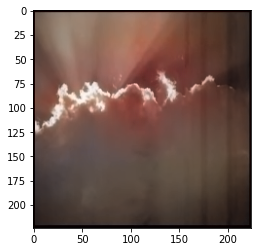

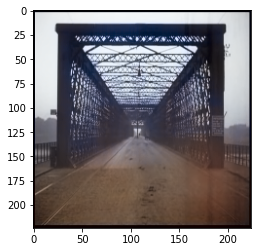

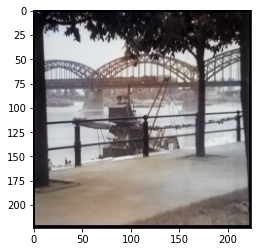

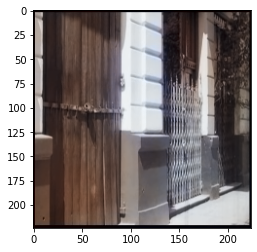

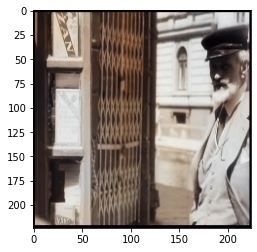

...

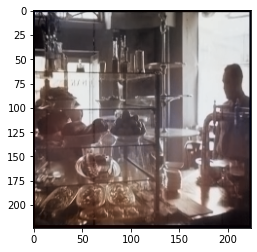

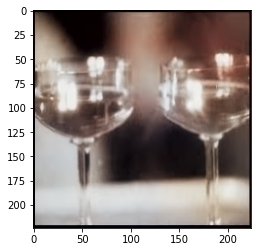

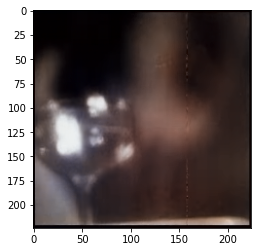

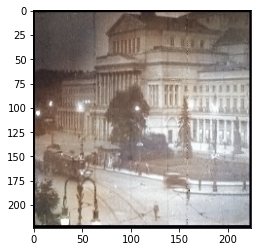

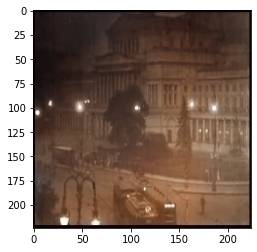

In [ ]:
for i in X_test:
  new_img=i
  new_img = color.rgb2lab(new_img).astype("float32")
  new_img= new_img[ ...,[0]] / 50. - 1. 
  pred = get_pred(g_model, new_img)
  imgplot = plt.imshow(get_LAB(new_img,pred))
  plt.show()